# Obiettivi
## 1. Analisi Descrittiva dei Contenuti

Il primo obiettivo del progetto è condurre un'analisi esplorativa dei dati (EDA) per capire le caratteristiche dei contenuti di Wikipedia suddivisi in diverse categorie tematiche, come ad esempio: - Cultura, Economia, Medicina, Tecnologia, Politica, Scienza, e altre.

L'analisi esplorativa prevede: - Il conteggio degli articoli presenti per ogni categoria. - Il numero medio di parole per articolo. - La lunghezza dell'articolo più lungo e di quello più corto per ciascuna categoria. - La creazione di nuvole di parole rappresentative per ogni categoria, per identificare i termini più frequenti e rilevanti.

## 2. Sviluppo di un Classificatore Automatico

Il secondo obiettivo è creare un modello di machine learning capace di classificare automaticamente gli articoli in base alla loro categoria. Il sistema di classificazione verrà addestrato utilizzando dati di testo presenti nelle seguenti colonne del dataset: - Sommario (summary): Introduzione breve dell'articolo. - Testo Completo (documents): Contenuto completo dell'articolo.

## 3. Identificazione di Nuovi Insights

L'analisi consentirà anche di ottenere preziosi insights sui contenuti di Wikipedia, come la densità di articoli per categoria o le tendenze linguistiche associate a determinati argomenti. Queste informazioni possono aiutare Wikimedia a migliorare l'organizzazione delle pagine e a ottimizzare i propri sforzi editoriali.

In [0]:
%pip install wordcloud

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
%pip install langdetect

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
import pandas as pd

# graphic modules
import matplotlib.pyplot as plt
import seaborn as sns

from wordcloud import WordCloud
from langdetect import detect

# pyspark SQL
from pyspark.sql import SparkSession
from pyspark.sql.functions import length, min, max,avg, round,concat_ws,regexp_replace, lower,expr,udf
from pyspark.sql.types import StringType
# pyspark ML
from pyspark.ml.feature import CountVectorizer, StringIndexer,StandardScaler,Tokenizer, StopWordsRemover
from pyspark.ml.classification import RandomForestClassifier,LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml import Pipeline

# IMPORTAZIONE DEL DATASET

## Conversione in Spark dataframe

In [0]:
# Initialize SparkSession if not already active
spark = SparkSession.builder.appName("Wikipedia_Analysis").getOrCreate()

In [0]:
spark_df = spark.read.table("workspace.default.wikipedia")

# ANALISI DEL DATASET

## Visualizazione contenuto e tipo dati

In [0]:
spark_df.printSchema()

root
 |-- title: string (nullable = true)
 |-- summary: string (nullable = true)
 |-- documents: string (nullable = true)
 |-- categoria: string (nullable = true)



In [0]:
display(spark_df.limit(10))

title summary documents categoria foxhall p. keene foxhall parker keene (december 18, 1867 – september 25, 1941) was an american thoroughbred race horse owner and breeder, a world and olympic gold medallist in polo and an amateur tennis player. he was rated the best all-around polo player in the united states for eight consecutive years, a golfer who competed in the u.s. open, and a pioneer racecar driver who vied for the gordon bennett cup. in addition to his substantial involvement in flat racing, he was also a founding member of the national steeplechase association. foxhall parker keene (december 18, 1867 – september 25, 1941) was an american thoroughbred race horse owner and breeder, a world and olympic gold medallist in polo and an amateur tennis player. he was rated the best all-around polo player in the united states for eight consecutive years, a golfer who competed in the u.s. open, and a pioneer racecar driver who vied for the gordon bennett cup. in addition to his substantial involvement in flat racing, he was also a founding member of the national steeplechase association. biography he was born in san francisco, california on december 18, 1867 to sarah jay daingerfield and james robert keene. at the time of his birth, his father was president of the san francisco stock exchange. james r. keene was also a major owner/breeder of thoroughbred racehorses and a founder of the jockey club from whom foxhall keene inherited castleton farm, an important breeding operation near lexington, kentucky. keene was an avid golfer who competed in the 1897 u.s. open and who made it to the quarterfinals in the 1898 u.s. amateur. although he played at a high level in a number of sports, he excelled at the game of polo. a 10-goal player, he was a member of the rockaway hunting club in lawrence, nassau county, new york, today the oldest country club in the united states. with team captain tommy hitchcock, in 1886 he was part of the first u.s. international polo team that competed in the inaugural international polo cup matches against england. he was rated the best all-around polo player in the united states for eight consecutive years and won the gold medal in polo at the 1900 summer olympics. following its formation, he was inducted posthumously into the museum of polo and hall of fame in 1992. keene also competed as a top-level tennis player, reaching the semifinals of the 1883 u.s. national championships and the quarterfinals in 1885. with the advent of automobile racing, keene competed in the 1903 gordon bennett cup at athy, county kildare, ireland driving a mercedes. in a race won by camille jenatzy, he did not finish after his car experienced axle problems. keene maintained a country home at monkton, maryland and a home in england with a stable at melton mowbray where he kept up to ten field hunters for fox hunting. in addition, he had a seasonal residence at ayer's cliff, quebec on lake massawippi. he died in poverty on september 25, 1941 at ayer's cliff, quebec. legacy his father named one of his horses foxhall who won the 1882 ascot gold cup in england. recently, two thoroughbred racehorses, one born in 1983 and another in 2002, were named after foxhall keene. several publications, including the american heritage cookbook and illustrated history of american eating and drinking and the encyclopedia of north american eating and drinking traditions, customs and rituals claim that chicken à la king was prepared at keene's suggestion. references external links hatch, alden and foxhall keene. full tilt. the sporting memoirs of foxhall keene. (1938) the derrydale press isbn 1-199-23975-5 eclipse press story of james and foxhall keene foxhall keene racing in his mercedes (vanderbilt cup) rockaway hunting club information on foxhall keene foxhall p. keene at databaseolympics.com (archived) foxhall p. keene at olympics at sports-reference.com (archived) sports thomas william kirkwood thomas william kirkwood (1884–1971) was a scottish ch

## Gestione elementi duplicatied

In [0]:
# Trova i documenti duplicati nel dataframe
duplicate_docs = spark_df.groupBy("documents").count().filter("count > 1")

display(duplicate_docs)

documents count rudolph's shiny new year is a 1976 american-japanese christmas and new year's stop motion animated television special and a standalone sequel to the 1964 special rudolph the red-nosed reindeer produced by rankin/bass productions. the special premiered on abc on december 10, 1976.three years later, it was also aired on tv asahi in japan on december 24, 1979, under the japanese dub title 赤鼻のトナカイ ルドルフ物語 (akahananotonakai rudorufu monogatari). plot just after the events of rudolph the red-nosed reindeer, santa claus receives a letter from his friend father time asking for help to find happy the baby new year before midnight ("the 12th bong") on new year's eve or else it will be december 31 forever. santa sends rudolph out to find him due to the snowstorm currently happening outside. an evil giant vulture named eon the terrible is supposed to live for exactly one eon after which he will turn into ice and snow and disintegrate. as this particular eon will end january 1 of the new year, he plans to kidnap happy to keep the year from ending and stop time, thus preventing his predestined death. general ticker (a military clock) and the great quarter-past-five, or quart for short (a camel with a clock in his hump), bring rudolph to father time's castle beyond the sands of time. father time speculates that happy, who ran away due to his big ears being laughed at when they were first seen by nanny nine o'clock, is hiding out in the "archipelago of last years" where the old years retire and rule over an island styled to resemble the year over which they ruled. when rudolph is attacked by eon on the ocean while en route to the archipelago, he is saved by big ben (a sperm whale with a clock attached to his tail) who transports rudolph across the ocean. upon arrival in the archipelago, rudolph first travels to the island belonging to a caveman named o.m. (short for one million b.c.). o.m. inhabits an island anachronistically inhabited with friendly dinosaurs and other prehistoric creatures. as rudolph and his friends search for happy (who left after his hat accidentally fell off saving a baby pterodactyl and revealing his big ears, causing the dinosaurs to laugh), they repeatedly encounter eon. after other off-screen visits to the islands of 4000 b.c., 1492, 1893, and 1965 have been completed without success, rudolph and o.m. head for the island of 1023 (pronounced "ten to three," as in the time 2:50), belonging to a scottish knight with a long beard named sir 1023 whose island is filled with medieval trappings along with several fairy tale and mother goose characters. meanwhile, happy manages to befriend the three bears, but becomes saddened when he is forced to remove his hat while playing a game with baby bear and exposes his big ears to them, causing him to leave again despite baby bear begging him not to go. the group then travels to the island of 1776, which reflects colonial america and is ruled over by "sev" (aka 1776) who resembles benjamin franklin. following happy's seeming rejection on the island of 1776 following the daily fourth of july parade, eon kidnaps him and takes him to his lair on the island of no-name which is said to be located "due north of the north pole". the group now leaves the archipelego in pursuit. catching up to eon, they attempt to rescue happy. however, eon (upon being awakened by the sound of o.m. tumbling) thwarts them by sending an avalanche down on the group and trapping them inside giant snowballs. managing to melt his way free using his nose, rudolph climbs up to eon's nest where he finds happy, who refuses to leave. rudolph shows happy his nose and tells him his own story of being bullied because of his nonconformity before asking happy to let him see his ears. happy does so, and rudolph, like everyone else before him, laughs at the sight. happy once again gets upset, but rudolph explains that the sight of happy's ears had made him feel so wonderful that he had to laugh out loud, just 

In [0]:
# Elimina i duplicati basati sulla colonna 'documents'
spark_df = spark_df.dropDuplicates(["documents"])

## Distribuzione delle categorie degli articoli

In [0]:
spark_df.createOrReplaceTempView("wikipedia_articles")

category_counts = spark.sql("SELECT categoria, COUNT(*) AS numero_articoli FROM wikipedia_articles GROUP BY categoria ORDER BY numero_articoli DESC")

In [0]:
display(category_counts)

categoria,numero_articoli
transport,7841
medicine,7707
research,7430
technology,6641
engineering,6085
humanities,5755
finance,5267
pets,4605
energy,4441
economics,4209


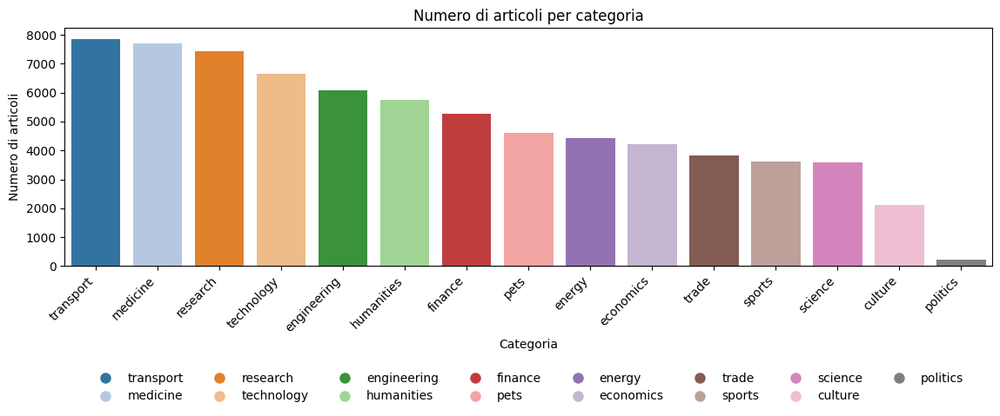

In [0]:
category_counts_pd = category_counts.toPandas()

plt.figure(figsize=(12, 7))
barplot = sns.barplot(
    data=category_counts_pd,
    x="categoria",
    y="numero_articoli",
    hue="categoria",
    palette="tab20",
    legend=False
)
plt.xlabel("Categoria")
plt.ylabel("Numero di articoli")
plt.title("Numero di articoli per categoria")
plt.xticks(rotation=45, ha="right")

max_cols = int(len(category_counts_pd["categoria"]) / 2) + (len(category_counts_pd["categoria"]) % 2)
handles = [plt.Line2D([0], [0], marker='o', color='w', label=cat, 
                      markerfacecolor=barplot.patches[i].get_facecolor(), markersize=10) 
           for i, cat in enumerate(category_counts_pd["categoria"])]
plt.legend(handles=handles, loc="upper center", bbox_to_anchor=(0.5, -0.4), ncol=max_cols, frameon=False)

plt.tight_layout(rect=[0, 0.15, 1, 1])
plt.show()

## Rappresentazione occorenze delle categorie negli articoli

In [0]:
# Create a dictionary of category frequencies
category_frequency = {row['categoria']: row['numero_articoli'] for row in category_counts.collect()}

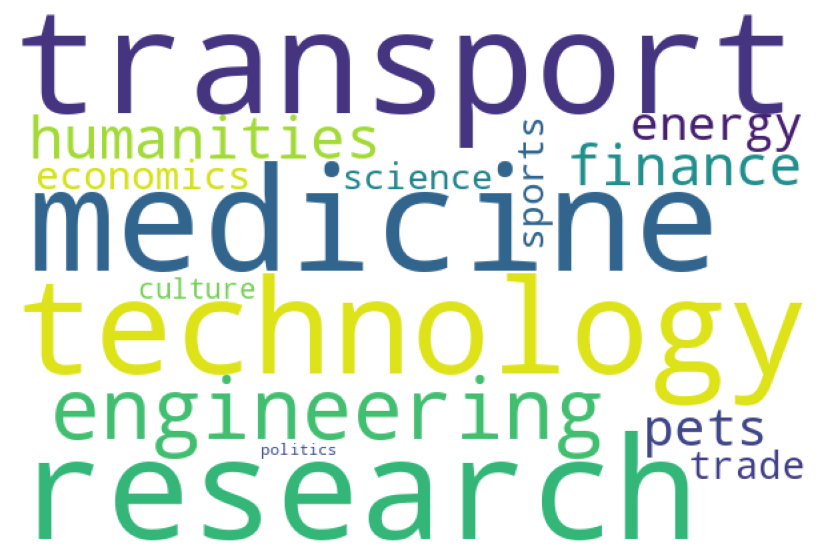

In [0]:
# Generate the word cloud
wordcloud = WordCloud(
    width = 600, height = 400,
    background_color ='white',
    min_font_size = 10).generate_from_frequencies(category_frequency)

# Display the word cloud
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

## Analisi della lunghezza degli articoli per categoria

In [0]:
## Add column with length of documents
spark_df = spark_df.withColumn("document_length", length(spark_df["documents"]))

In [0]:
avg_length = spark_df.select(round(avg("document_length"))).collect()[0][0]

print('La lungheza media degli articoli è di: ' + str(avg_length) + ' caratteri')

La lungheza media degli articoli è di: 4992.0 caratteri


In [0]:
display(spark_df.groupBy("categoria").agg(
    min("document_length").alias("Min length"),
    max("document_length").alias("Max length"),
    round(avg("document_length")).alias("Average length")
))

categoria,Min length,Max length,Average length
culture,70,102337,5259.0
economics,67,150009,5827.0
politics,77,128393,12697.0
transport,57,135535,2837.0
humanities,56,135319,5824.0
energy,60,146236,3759.0
technology,29,115154,5395.0
sports,90,115092,4515.0
trade,100,121240,5782.0
research,116,158762,4561.0


## Distribuzione delle lunghezze degli articoli per categoria

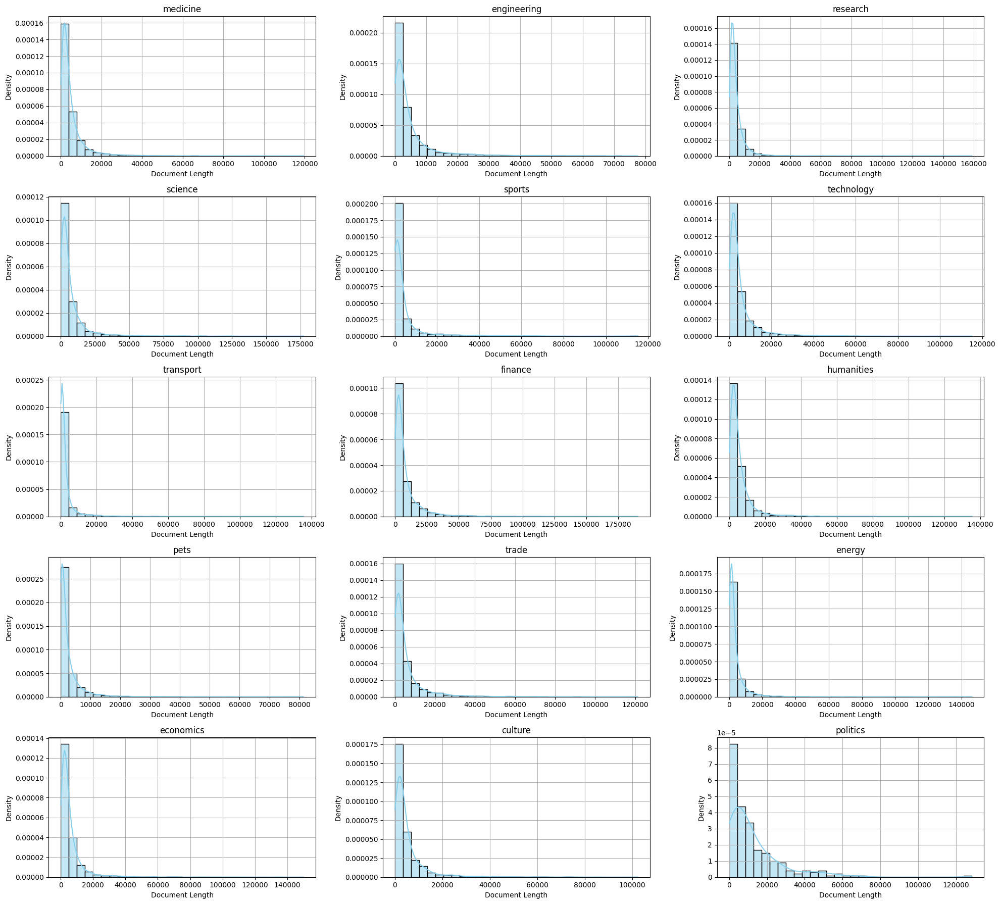

In [0]:
# Convert Spark DataFrame to Pandas for plotting
lengths_pd = spark_df.select("categoria", "document_length").toPandas()

unique_categories = lengths_pd["categoria"].unique()[:15]  # Limit to 15 categories for 5x3 grid

fig, axes = plt.subplots(5, 3, figsize=(20, 18))
axes = axes.flatten()

for idx, cat in enumerate(unique_categories):
    ax = axes[idx]
    cat_lengths = lengths_pd[lengths_pd["categoria"] == cat]["document_length"]
    sns.histplot(cat_lengths, kde=True, stat="density", bins=30, ax=ax, color="skyblue")
    ax.set_title(cat)
    ax.set_xlabel("Document Length")
    ax.set_ylabel("Density")
    ax.grid(True)

# Hide unused subplots if categories < 15
for j in range(len(unique_categories), 15):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# SVILUPPO DI UN CLASSIFICATORE AUTOMATICO

### Creazione unica colonna con tutto il testo da analizzare

In [0]:
# Combine 'title', 'summary', and 'documents' columns into a new column 'combined_text'
spark_df = spark_df.withColumn(
    "combined_text",
    concat_ws(" ", spark_df["title"], spark_df["summary"], spark_df["documents"])
)

## Creazione del dataset di test e di training

In [0]:
train,test = spark_df.randomSplit([0.7,0.3], seed=0)

In [0]:
print("Training Dataset Count: " + str(train.count()))
print("Test Dataset Count: " + str(test.count()))

Training Dataset Count: 51464
Test Dataset Count: 21907


## Preparazione dataset di training

In [0]:
# Remove parentheses, punctuation, numbers, and special characters from combined_text
train = train.withColumn(
    "clean_text",
    lower(regexp_replace(train["combined_text"], r"[\(\)\[\]\{\},.;:'\"!?@#$%^&*_+=<>|\\/~`0-9]", ""))
)

In [0]:
# Tokenize the combined_text column
tokenizer = Tokenizer(inputCol="clean_text", outputCol="tokens")
#train_tokenized = tokenizer.transform(train)

# stop words
add_stopwords = ["http","https","amp","rt","t","c","the"]
# Remove stop words
remover = StopWordsRemover(inputCol="tokens", outputCol="filtered_tokens").setStopWords(add_stopwords)
#train_no_stopwords = remover.transform(train_tokenized)

In [0]:
pipelineData = Pipeline(stages=[tokenizer, remover])

In [0]:
pipelineDataFit = pipelineData.fit(train)
train_no_stopwords = pipelineDataFit.transform(train)

In [0]:
# Remove empty elements from filtered_tokens
train_no_stopwords = train_no_stopwords.withColumn(
    "filtered_tokens",
    expr("filter(filtered_tokens, x -> x != '')")
)

## Creazione pipeline e addestramento del modello

In [0]:
# Convert filtered tokens to feature vectors
vectorizer = CountVectorizer(inputCol="filtered_tokens", outputCol="vector", vocabSize = 7000, minDF=0.01,maxDF=0.7)
# Scale the feature vectors
scaler = StandardScaler(inputCol="vector",outputCol="features")

# Index the target column
label_indexer = StringIndexer(inputCol="categoria", outputCol="label")

# Build pipeline
pipeline = Pipeline(stages=[vectorizer, scaler, label_indexer])

In [0]:
pipelineFit = pipeline.fit(train_no_stopwords)
dataset = pipelineFit.transform(train_no_stopwords)

### Logistic regretion model

In [0]:
lr = LogisticRegression(maxIter=20, regParam=0.3, elasticNetParam=0)

In [0]:
lrModel = lr.fit(dataset)

### Random forest model

In [0]:
# Random Forest classifier
rf = RandomForestClassifier(featuresCol="features", labelCol="label", numTrees=100, maxDepth = 4,
                            maxBins = 32)

In [0]:
rfModel = rf.fit(dataset)

## Predizioni Random Forest

In [0]:
test_clean = test.withColumn(
    "clean_text",
    lower(regexp_replace(test["combined_text"], r"[\(\)\[\]\{\},.;:'\"!?@#$%^&*_+=<>|\\/~`0-9]", ""))
)

In [0]:
# Transform the test set using the fitted pipeline to generate 'features' and 'label'
test_no_stopword = pipelineDataFit.transform(test_clean)

In [0]:
test_dataset = pipelineFit.transform(test_no_stopword)

In [0]:
rfPredictions = rfModel.transform(test_dataset)

display(rfPredictions.select("combined_text", "label", "prediction"))

combined_text label prediction 1 new york place 1 new york place was a supertall skyscraper proposed in 2002 that would have risen 1,050 feet (320 meters) tall and had ninety floors, but the project was canceled. it was supposed to be located in new york city’s financial district in lower manhattan. it would have taken up an entire block on broadway where fulton street and john street meet. the tower was designed by kohn pedersen fox and projected to cost $680 million. it would have had 1.3 million square feet (121,000 square meters) of floor space, allocating 679,000 square feet (63081.16 square meters) of floor space to be occupied by business owners and small companies. the building would have offered 68 floors of apartment space.underneath the suggested location, another project was proposed. according to the lower manhattan development corporation and the new york times, the project would be the headhouse building for the fulton center, an underground transit hub proposed by metropolitan transportation authority (mta) with a projected cost of $2 billion. the mta would have been a partner, with their proposed transit hub at the location.trevor davis, the project developer from south africa, was very optimistic throughout the beginning phases of the proposed skyscraper, despite the tension in new york only a year after the september 11 attacks on the world trade center.aby rosen and michael fuchs are investing partners and co-founders of rfr realty: before the cancellation of the project, the two investors were set to partner with trevor davis for the construction of 1 new york place. 1 new york place was a supertall skyscraper proposed in 2002 that would have risen 1,050 feet (320 meters) tall and had ninety floors, but the project was canceled. it was supposed to be located in new york city’s financial district in lower manhattan. it would have taken up an entire block on broadway where fulton street and john street meet. the tower was designed by kohn pedersen fox and projected to cost $680 million. it would have had 1.3 million square feet (121,000 square meters) of floor space, allocating 679,000 square feet (63081.16 square meters) of floor space to be occupied by business owners and small companies. the building would have offered 68 floors of apartment space.underneath the suggested location, another project was proposed. according to the lower manhattan development corporation and the new york times, the project would be the headhouse building for the fulton center, an underground transit hub proposed by metropolitan transportation authority (mta) with a projected cost of $2 billion. the mta would have been a partner, with their proposed transit hub at the location.trevor davis, the project developer from south africa, was very optimistic throughout the beginning phases of the proposed skyscraper, despite the tension in new york only a year after the september 11 attacks on the world trade center.aby rosen and michael fuchs are investing partners and co-founders of rfr realty: before the cancellation of the project, the two investors were set to partner with trevor davis for the construction of 1 new york place. == references == 6.0 0.0 112th street bridge the 112th street bridge is a bridge that carries new york state route 470 across the hudson river in new york. it connects van schaick island in the city of cohoes with the lansingburgh neighborhood of troy. the original bridge was built in 1922 and demolished in 1995. the newer version was completed in 1996. the 112th street bridge is a bridge that carries new york state route 470 across the hudson river in new york. it connects van schaick island in the city of cohoes with the lansingburgh neighborhood of troy. the original bridge was built in 1922 and demolished in 1995. the newer version was completed in 1996. see also list of fixed crossings of the hudson river references external links 112th street bridge at structurae 0.0 0.0 1882 u.s. national championshi

## Predizioni Logistic Regression model

In [0]:
lrPredictions = lrModel.transform(test_dataset)

display(lrPredictions.select("combined_text", "label", "prediction"))

combined_text label prediction 1 new york place 1 new york place was a supertall skyscraper proposed in 2002 that would have risen 1,050 feet (320 meters) tall and had ninety floors, but the project was canceled. it was supposed to be located in new york city’s financial district in lower manhattan. it would have taken up an entire block on broadway where fulton street and john street meet. the tower was designed by kohn pedersen fox and projected to cost $680 million. it would have had 1.3 million square feet (121,000 square meters) of floor space, allocating 679,000 square feet (63081.16 square meters) of floor space to be occupied by business owners and small companies. the building would have offered 68 floors of apartment space.underneath the suggested location, another project was proposed. according to the lower manhattan development corporation and the new york times, the project would be the headhouse building for the fulton center, an underground transit hub proposed by metropolitan transportation authority (mta) with a projected cost of $2 billion. the mta would have been a partner, with their proposed transit hub at the location.trevor davis, the project developer from south africa, was very optimistic throughout the beginning phases of the proposed skyscraper, despite the tension in new york only a year after the september 11 attacks on the world trade center.aby rosen and michael fuchs are investing partners and co-founders of rfr realty: before the cancellation of the project, the two investors were set to partner with trevor davis for the construction of 1 new york place. 1 new york place was a supertall skyscraper proposed in 2002 that would have risen 1,050 feet (320 meters) tall and had ninety floors, but the project was canceled. it was supposed to be located in new york city’s financial district in lower manhattan. it would have taken up an entire block on broadway where fulton street and john street meet. the tower was designed by kohn pedersen fox and projected to cost $680 million. it would have had 1.3 million square feet (121,000 square meters) of floor space, allocating 679,000 square feet (63081.16 square meters) of floor space to be occupied by business owners and small companies. the building would have offered 68 floors of apartment space.underneath the suggested location, another project was proposed. according to the lower manhattan development corporation and the new york times, the project would be the headhouse building for the fulton center, an underground transit hub proposed by metropolitan transportation authority (mta) with a projected cost of $2 billion. the mta would have been a partner, with their proposed transit hub at the location.trevor davis, the project developer from south africa, was very optimistic throughout the beginning phases of the proposed skyscraper, despite the tension in new york only a year after the september 11 attacks on the world trade center.aby rosen and michael fuchs are investing partners and co-founders of rfr realty: before the cancellation of the project, the two investors were set to partner with trevor davis for the construction of 1 new york place. == references == 6.0 6.0 112th street bridge the 112th street bridge is a bridge that carries new york state route 470 across the hudson river in new york. it connects van schaick island in the city of cohoes with the lansingburgh neighborhood of troy. the original bridge was built in 1922 and demolished in 1995. the newer version was completed in 1996. the 112th street bridge is a bridge that carries new york state route 470 across the hudson river in new york. it connects van schaick island in the city of cohoes with the lansingburgh neighborhood of troy. the original bridge was built in 1922 and demolished in 1995. the newer version was completed in 1996. see also list of fixed crossings of the hudson river references external links 112th street bridge at structurae 0.0 0.0 1882 u.s. national championshi

## Valutazione delle performance

In [0]:
evaluator = MulticlassClassificationEvaluator(
    labelCol='label',
    predictionCol='prediction',
    metricName='accuracy')

### Performance Random Forest

In [0]:
evaluator.evaluate(rfPredictions)

0.5319760807047975

### Performance Logisti regression

In [0]:
evaluator.evaluate(lrPredictions)

0.806135025334368

# Risultato valutazione modelli
La Logistic Regression raggiunge un'accuratezza di 0.80, superando il Random Forest che si ferma a 0.53. il Random Forest è generalmente un metodo ensemble robusto e versatile, ma tende ad avere difficoltà con dati sparsi ad alta dimensionalità, come i vettori bag-of-words tipici dei task di classificazione del testo.
La Logistic Regression, al contrario, è particolarmente adatta a questo tipo di dati in quanto gestisce in modo efficiente input sparsi ad alta dimensionalità e beneficia della separabilità lineare che spesso caratterizza le feature testuali dopo la vettorizzazione.
Sulla base di questi risultati, la Logistic Regression è il modello con le migliori prestazioni per questo esperimento e verrà selezionata come classificatore finale.

# RICONOSCIMENTO DELLE LINGUE

In [0]:
# UDF to detect language
detect_language_udf = udf(lambda text: detect(text) if text else None, StringType())

# Add language column to test_dataset
spark_df = spark_df.withColumn("language", detect_language_udf(spark_df["combined_text"]))



In [0]:
display(spark_df.select("combined_text", "language").limit(5))

combined_text language punctelia borreri punctelia borreri is a species of foliose lichen in the family parmeliaceae. it is a common and widely distributed species, occurring in tropical, subtropical, and temperate regions of africa, asia, europe, north america, oceania, and south america. the lichen typically grows on bark of deciduous trees, and less commonly on rock. some european countries have reported increases in the geographic range or regional frequency of the lichen in recent decades, attributed alternatively to a reduction of atmospheric sulphur dioxide levels or an increase in temperatures resulting from climate change. the lichen is characterised by a greenish-grey to bluish-grey upper thallus surface, a black lower surface, pseudocyphellae on the surface of the thallus (tiny pores that facilitate gas exchange), and chemically, by the presence of gyrophoric acid in the medulla. there are several lookalike punctelia species, including p. subrudecta, p. perreticulata, and p. reddenda. these can be distinguished from p. borreri by differences in chemistry, in the nature of the vegetative reproductive structures present on the thallus, or the colour of the thallus underside. punctelia borreri is named after william borrer, a botanist who made the first scientific collections of the lichen in early 19th-century england. james edward smith was the first to publish a scientific description of the species in 1807, followed independently a year later by dawson turner. it was later assigned as the type species of punctelia by hildur krog when she circumscribed the new genus in 1982. punctelia borreri is used as a component of traditional chinese medicine. the lichen has been shown to harbour other organisms, including endophytic fungi and lichenicolous fungi. punctelia borreri is a species of foliose lichen in the family parmeliaceae. it is a common and widely distributed species, occurring in tropical, subtropical, and temperate regions of africa, asia, europe, north america, oceania, and south america. the lichen typically grows on bark of deciduous trees, and less commonly on rock. some european countries have reported increases in the geographic range or regional frequency of the lichen in recent decades, attributed alternatively to a reduction of atmospheric sulphur dioxide levels or an increase in temperatures resulting from climate change. the lichen is characterised by a greenish-grey to bluish-grey upper thallus surface, a black lower surface, pseudocyphellae on the surface of the thallus (tiny pores that facilitate gas exchange), and chemically, by the presence of gyrophoric acid in the medulla. there are several lookalike punctelia species, including p. subrudecta, p. perreticulata, and p. reddenda. these can be distinguished from p. borreri by differences in chemistry, in the nature of the vegetative reproductive structures present on the thallus, or the colour of the thallus underside. punctelia borreri is named after william borrer, a botanist who made the first scientific collections of the lichen in early 19th-century england. james edward smith was the first to publish a scientific description of the species in 1807, followed independently a year later by dawson turner. it was later assigned as the type species of punctelia by hildur krog when she circumscribed the new genus in 1982. punctelia borreri is used as a component of traditional chinese medicine. the lichen has been shown to harbour other organisms, including endophytic fungi and lichenicolous fungi. systematics the lichen was first formally described as lichen borreri by english botanist james edward smith in the 25th volume of his work english botany, published in 1807. the first scientific collections of the lichen were made by another english botanist, william borrer, whose name is honoured in the species epithet borreri. the type locality was sussex, where borrer noted the lichen to be "not uncommon on the trunks of trees, especially on fruit

In [0]:
# Get language frequencies
lang_freq = spark_df.groupBy("language").count().orderBy("count", ascending=False).toPandas()

In [0]:
display(lang_freq)

language,count
en,73221
fr,46
de,37
es,14
nl,11
it,7
pt,7
id,6
pl,6
hr,2


In [0]:
%pip install langcodes
%pip install language_data

from langcodes import Language

In [0]:
# Create a dictionary of language frequencies with full language names
lang_dict = {Language.get(lang).display_name(): count for lang, count in zip(lang_freq['language'], lang_freq['count'])}

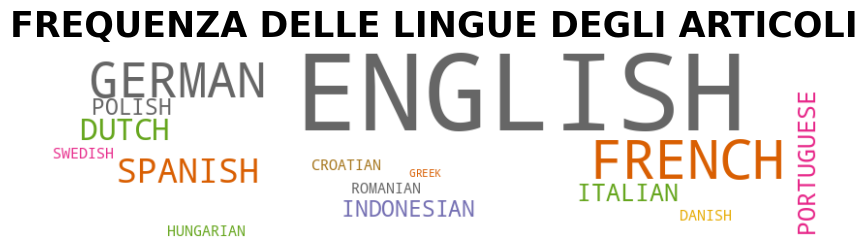

In [0]:
# Generate word cloud with bold and uppercase labels, showing all 15 languages
wordcloud = WordCloud(
    width=800,
    background_color='white',
    min_font_size=10,  # reduce min_font_size to show low-frequency labels
    max_words=15,  # ensure all 15 languages are shown
    include_numbers=True,
    colormap="Dark2"
).generate_from_frequencies({k.upper(): v for k, v in lang_dict.items()})

plt.figure(figsize=(10, 5))
plt.title('FREQUENZA DELLE LINGUE DEGLI ARTICOLI', fontsize=25, fontweight='bold')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# BIBLIOGRAFIA
1. [Removing stopwords from text with saprk nlp](https://www.johnsnowlabs.com/text-cleaning-removing-stopwords-from-text-with-spark-nlp/)
2. [Multi class classification](https://medium.com/data-science/multi-class-text-classification-with-pyspark-7d78d022ed35)
3. [Language detector](https://medium.com/@monigrancharov/text-language-detection-with-python-beb49d9667b3)